<a href="https://colab.research.google.com/github/CynthiaWanyonyi/Phase4-Project-Image-Classification-with-Deep-Learning/blob/tony/Image_Classification_Phase4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Class weight calculation
from sklearn.utils.class_weight import compute_class_weight

# Keras library
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from keras import regularizers
from keras.callbacks import ReduceLROnPlateau

# Different CNN Model
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, MobileNetV2, DenseNet121

# To chain two different data augmented images for training
from itertools import chain

#  Distributed Computing
import tensorflow as tf
import os
from PIL import Image
from google.colab import drive
drive.mount('/content/drive')
import zipfile
import cv2
import hashlib
from collections import defaultdict

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Phase 4 data/archive (1).zip'

Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

In [ ]:
# Path to the zip file
zip_file_path = '/content/drive/MyDrive/Copy of Copy of xray.zip'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Directory to extract the contents
extracted_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted'

In [ ]:
# List all items (files and subdirectories) in the extracted directory
items = os.listdir(extracted_dir)
items

['chest_xray']

In [ ]:
# Filter out only the subdirectories
subdirectories = [item for item in items if os.path.isdir(os.path.join(extracted_dir, item))]
subdirectories

['chest_xray']

In [ ]:
#Working with each subdirectory
for subdir in subdirectories:
    subdir_path = os.path.join(extracted_dir, subdir)
# Perform actions on the subdirectory
print("Working with:", subdir_path)

Working with: /content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray


In [ ]:
#List the files in each subdirectory
files_in_subdir = os.listdir(subdir_path)
print("Files in", subdir, ":", files_in_subdir)


Files in chest_xray : ['__MACOSX', 'chest_xray', 'test', 'train', 'val']


In [ ]:
# Path to the 'chest_xray' subdirectory
chest_xray_dir = os.path.join(extracted_dir, 'chest_xray')

In [ ]:
# List of subdirectories within 'chest_xray'
subdirectories = ['test', 'train', 'val']

In [ ]:
for file in files_in_subdir:
  file_path = os.path.join(subdir_path, file)

# Data Distribution
Below we will look at the distribution of the classes in our data




In [ ]:
# Counting Files and Class Distribution:
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    class_counts = {}

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        num_files = len(os.listdir(class_dir))
        class_counts[class_name] = num_files

    print(f"Class distribution in {subdir}: {class_counts}")


Class distribution in test: {'NORMAL': 231, 'PNEUMONIA': 387}
Class distribution in train: {'NORMAL': 1340, 'PNEUMONIA': 3850}
Class distribution in val: {'NORMAL': 8, 'PNEUMONIA': 8}


In [ ]:
# Calculating class weights
class_weights = {}

for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    class_counts = {}

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        num_files = len(os.listdir(class_dir))
        class_counts[class_name] = num_files

    total_samples = sum(class_counts.values())

    class_weights[subdir] = {}
    for class_name, count in class_counts.items():
        class_weight = total_samples / (len(classes) * count)
        class_weights[subdir][class_name] = class_weight

print("Class Weights:")
for subdir, weights in class_weights.items():
    print(subdir)
    for class_name, weight in weights.items():
        print(f"{class_name}: {weight:.4f}")

Class Weights:
test
NORMAL: 1.3377
PNEUMONIA: 0.7984
train
NORMAL: 1.9366
PNEUMONIA: 0.6740
val
NORMAL: 1.0000
PNEUMONIA: 1.0000


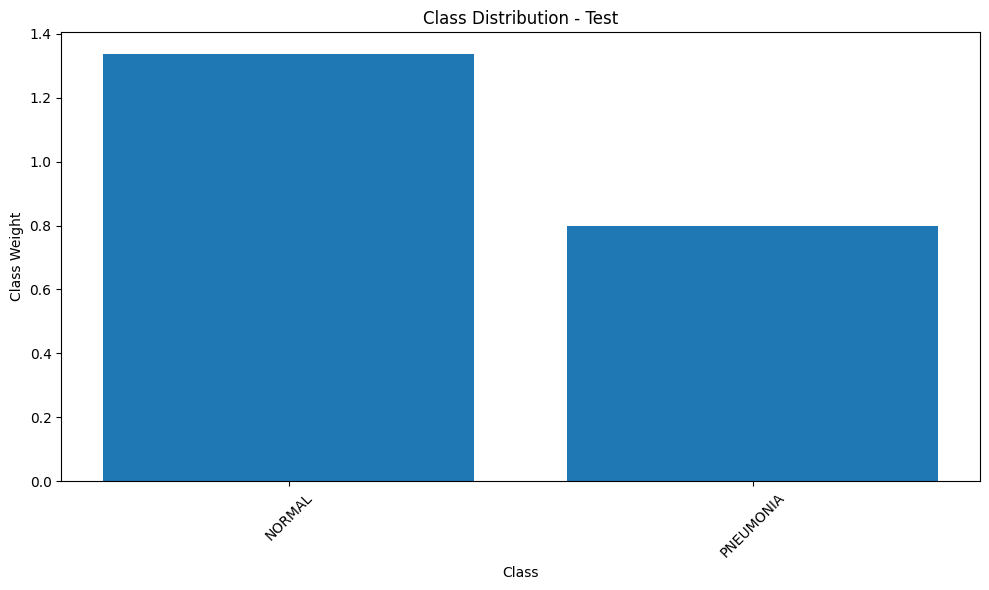

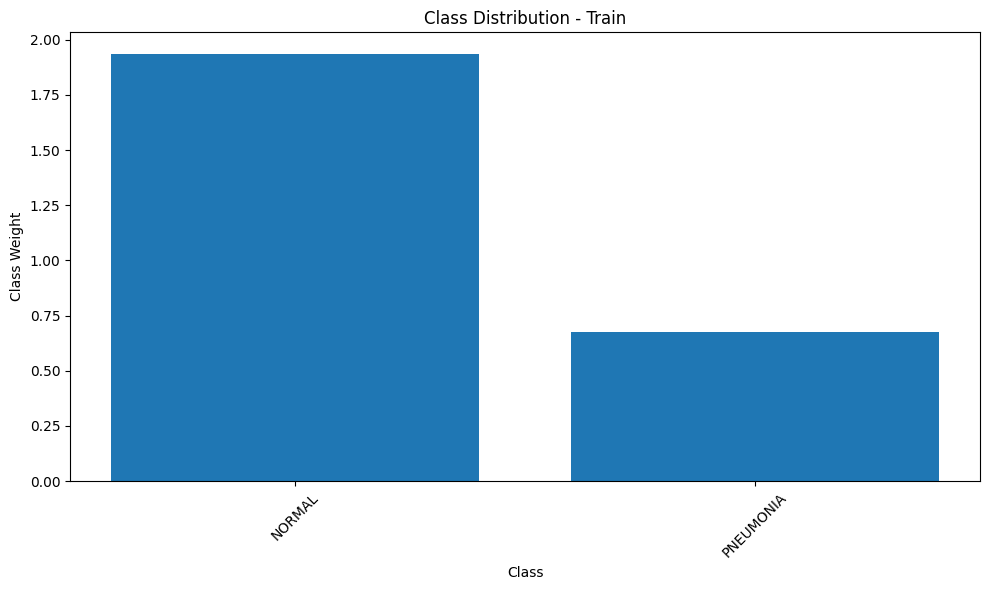

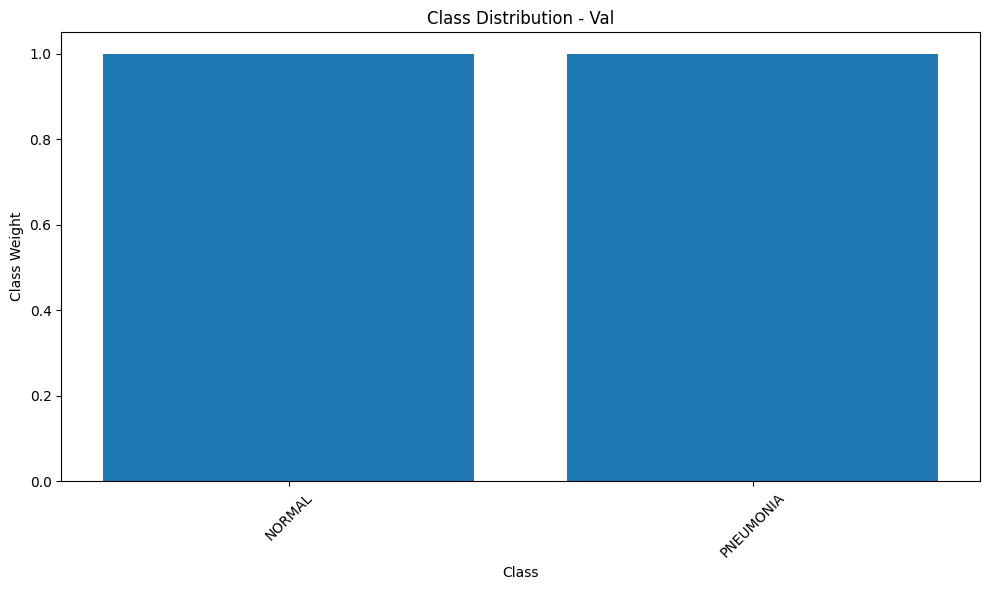

In [ ]:
# Plot the class distribution using class weights
for subdir, weights in class_weights.items():
    plt.figure(figsize=(10, 6))
    plt.bar(weights.keys(), weights.values())
    plt.xlabel('Class')
    plt.ylabel('Class Weight')
    plt.title(f'Class Distribution - {subdir.capitalize()}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

**Find the mean and standard deviation**

In [ ]:
# Initialize variables to store mean and standard deviation
mean_values = []
std_values = []

# Loop through subdirectories and classes
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
            pixel_values = img.flatten()

            mean_values.append(np.mean(pixel_values))
            std_values.append(np.std(pixel_values))

# Calculate mean and standard deviation
overall_mean = np.mean(mean_values)
overall_std = np.mean(std_values)

print("Overall Mean:", overall_mean)
print("Overall Standard Deviation:", overall_std)

Overall Mean: 122.76885700755456
Overall Standard Deviation: 56.99272167810361


The above calculated mean and standard deviation values will be useful for normalizing the pixel values of our images before feeding them into a neural network for training.


**Dealing with duplicates**

In [ ]:
# Initialize a dictionary to store duplicate image counts
duplicate_paths = defaultdict(list)

# Loop through subdirectories and classes
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        # Create a dictionary to store seen hashes
        seen_hashes = set()

        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            with open(image_path, "rb") as f:
                image_hash = hash(f.read())

            # Check for duplicates
            if image_hash in seen_hashes:
                duplicate_paths[subdir].append(image_path)
            else:
                seen_hashes.add(image_hash)

# Print duplicate counts
for subdir, paths in duplicate_paths.items():
    print(f"Number of duplicates in {subdir}: {len(paths)}")


In [ ]:
# Remove duplicate images
for subdir, paths in duplicate_paths.items():
    for path in paths:
        os.remove(path)
        print("Removed duplicate:", path)

# Print removal summary
print("Duplicate removal complete.")

Duplicate removal complete.


**Visualizations of sample images**

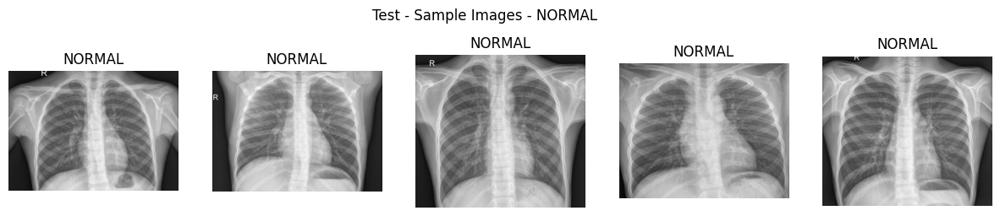

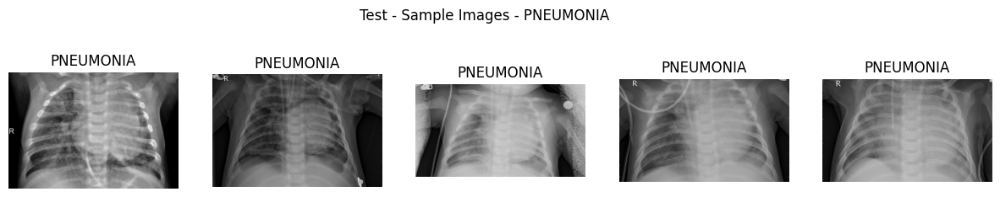

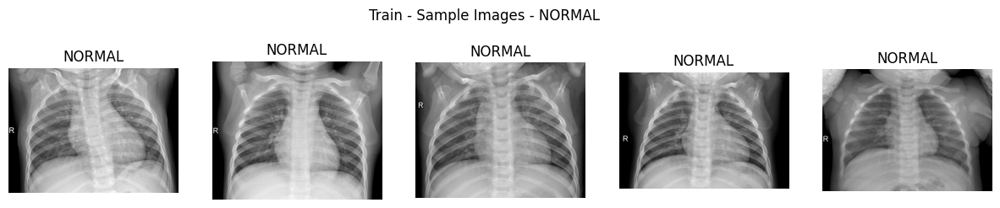

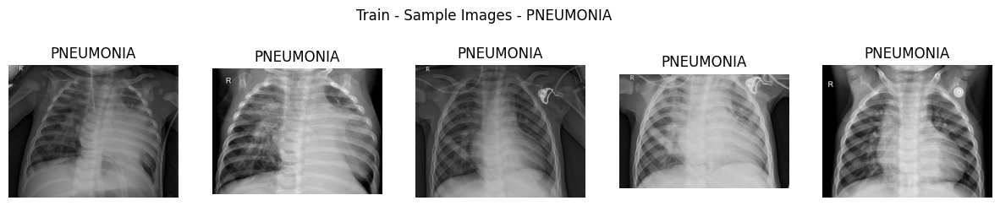

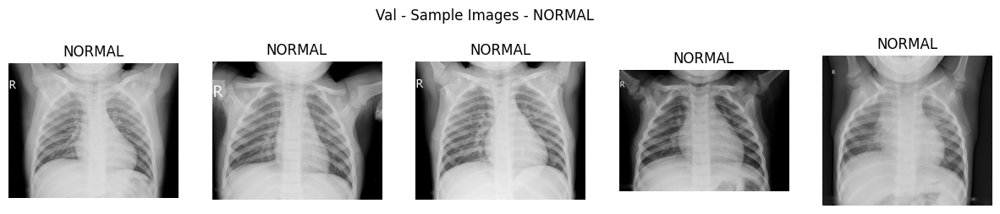

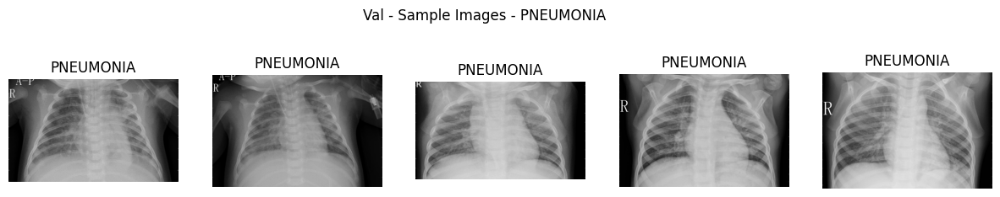

In [ ]:
#Visualizing Sample Images:

import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        num_samples = min(5, len(sample_images))  # Number of images to display (limit to 5)

        plt.figure(figsize=(15, 3))

        for i in range(num_samples):
            image_path = os.path.join(class_dir, sample_images[i])
            image = imread(image_path)

            plt.subplot(1, num_samples, i+1)
            plt.imshow(image, cmap='gray')
            plt.title(class_name)
            plt.axis('off')

        plt.suptitle(f"{subdir.capitalize()} - Sample Images - {class_name}")
        plt.show()


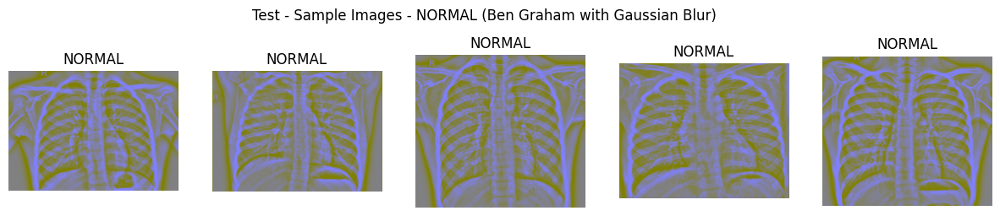

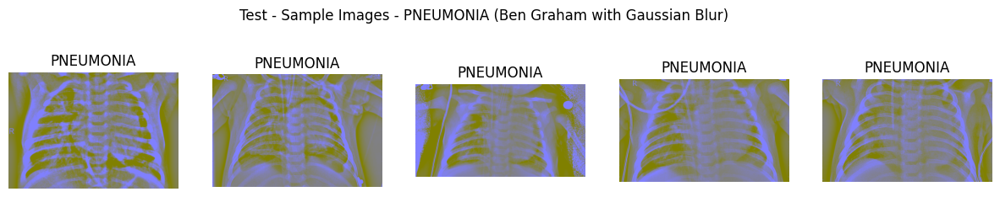

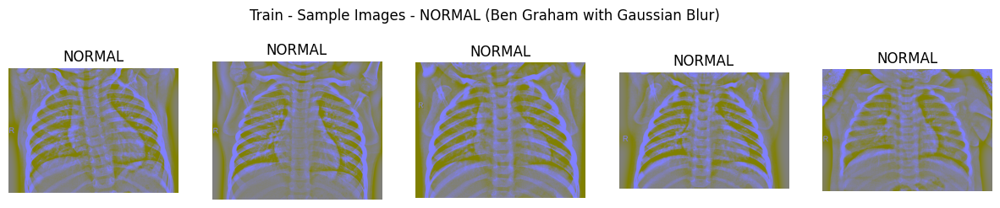

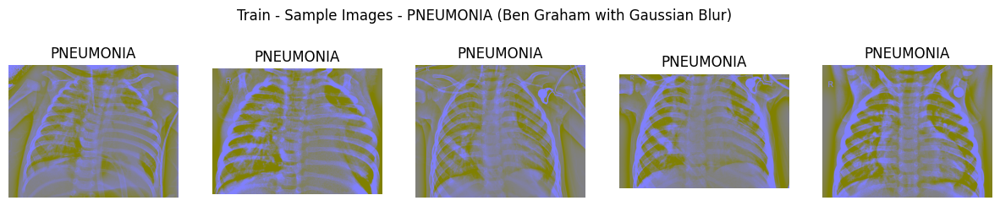

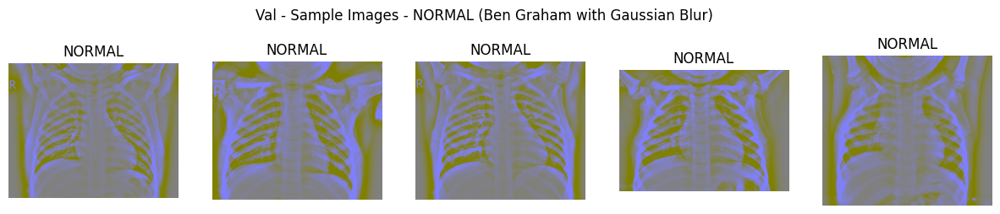

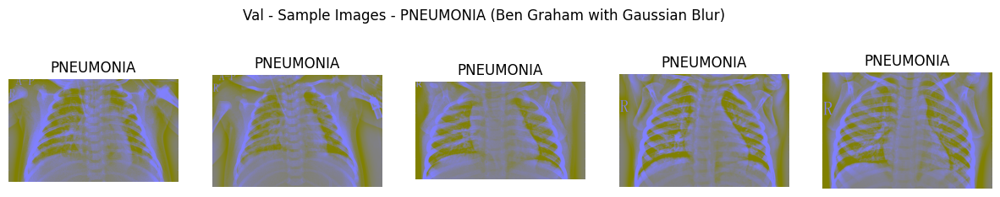

In [ ]:
# Define Ben Graham's preprocessing function with Gaussian blur
def ben_graham_preprocessing(image):
    img_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    img_processed = cv2.addWeighted(img_hsv, 4, cv2.GaussianBlur(img_hsv, (0, 0), 512/10), -4, 128)
    return img_processed

# Loop through subdirectories and classes
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        num_samples = min(5, len(sample_images))  # Number of images to display (limit to 5)

        plt.figure(figsize=(15, 3))

        for i in range(num_samples):
            image_name = sample_images[i]
            image_path = os.path.join(class_dir, image_name)
            image = cv2.imread(image_path)

            # Apply Ben Graham's preprocessing
            preprocessed_image = ben_graham_preprocessing(image)

            plt.subplot(1, num_samples, i+1)
            plt.imshow(preprocessed_image)
            plt.title(class_name)
            plt.axis('off')

        plt.suptitle(f"{subdir.capitalize()} - Sample Images - {class_name} (Ben Graham with Gaussian Blur)")
        plt.show()

In [ ]:
import os
import cv2

# Define the path to your dataset directory
chest_xray_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray'
# Define the subdirectories
subdirectories = ["train", "test", "val"]

# Initialize dictionaries to store image dimensions for each subset
image_dimensions = {}

# Loop through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    subset_dimensions = {}

    # Loop through classes
    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        class_dimensions = []

        # Loop through images
        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = img.shape[:2]
            class_dimensions.append((width, height))

        subset_dimensions[class_name] = class_dimensions

    image_dimensions[subdir] = subset_dimensions

# Print image dimensions
for subdir, subset_dimensions in image_dimensions.items():
    print(f"Subset: {subdir}")
    for class_name, dimensions in subset_dimensions.items():
        print(f"Class: {class_name}")
        for width, height in dimensions:
            print(f"Image dimensions: {width} x {height}")

# Note: The above code assumes all images have the same dimensions within each class.


Streaming output truncated to the last 5000 lines.
Image dimensions: 1666 x 1360
Image dimensions: 1790 x 1600
Image dimensions: 1310 x 1306
Image dimensions: 1716 x 1523
Image dimensions: 1516 x 1291
Image dimensions: 2362 x 2187
Image dimensions: 1518 x 1310
Image dimensions: 1588 x 1438
Image dimensions: 1742 x 1372
Image dimensions: 1696 x 1287
Image dimensions: 1862 x 1441
Image dimensions: 1716 x 1225
Image dimensions: 1836 x 1592
Image dimensions: 1464 x 1205
Image dimensions: 1754 x 1499
Image dimensions: 1692 x 1360
Image dimensions: 2078 x 2067
Image dimensions: 1306 x 1047
Image dimensions: 1746 x 1576
Image dimensions: 1616 x 1187
Image dimensions: 1882 x 1418
Image dimensions: 1350 x 1090
Image dimensions: 1898 x 1804
Image dimensions: 1608 x 1348
Image dimensions: 2040 x 2059
Image dimensions: 1828 x 1781
Image dimensions: 1636 x 1218
Image dimensions: 1898 x 1565
Image dimensions: 1376 x 1105
Image dimensions: 1592 x 1392
Image dimensions: 1558 x 1167
Image dimensions: 1

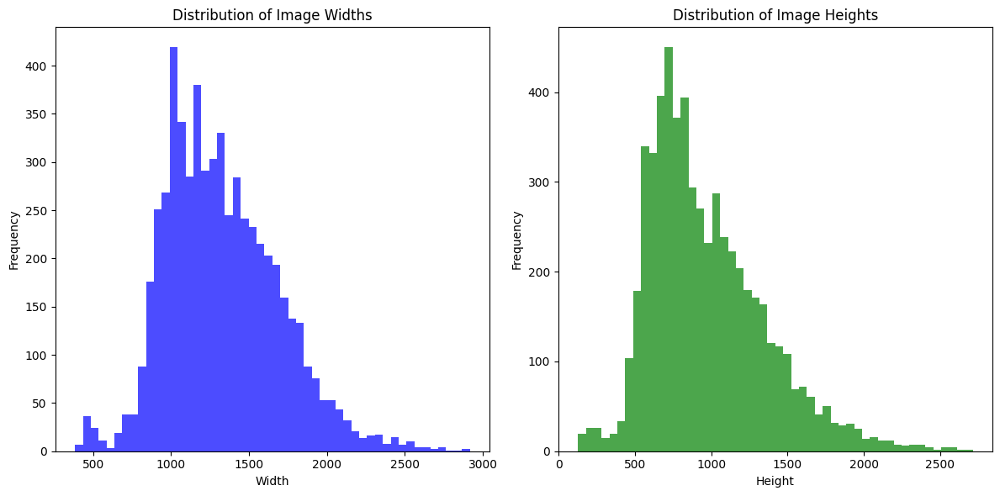

In [ ]:
subdirectories = ["train", "test", "val"]

# Initialize lists to store image dimensions
all_widths = []
all_heights = []

# Loop through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    # Loop through classes
    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        # Loop through images
        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = img.shape[:2]
            all_widths.append(width)
            all_heights.append(height)

# Plot histograms for image widths and heights
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(all_widths, bins=50, color='blue', alpha=0.7)
plt.title("Distribution of Image Widths")
plt.xlabel("Width")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(all_heights, bins=50, color='green', alpha=0.7)
plt.title("Distribution of Image Heights")
plt.xlabel("Height")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

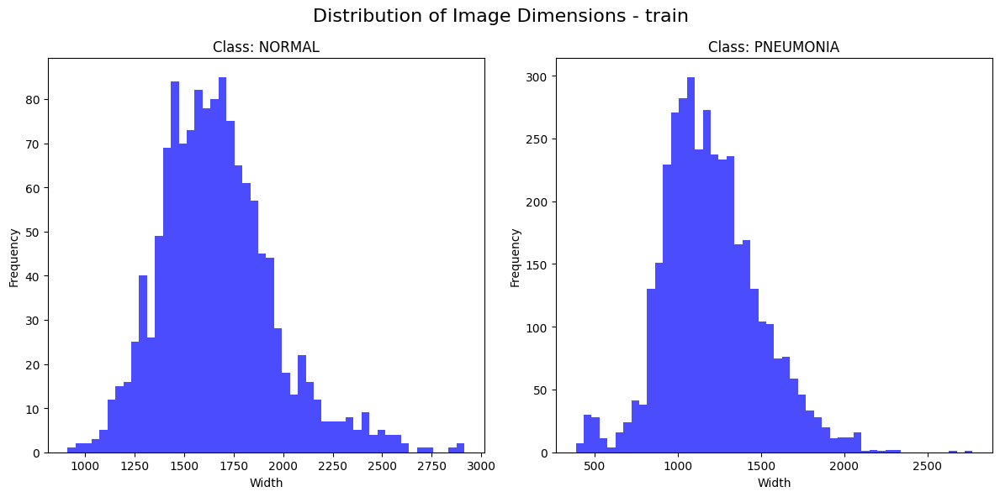

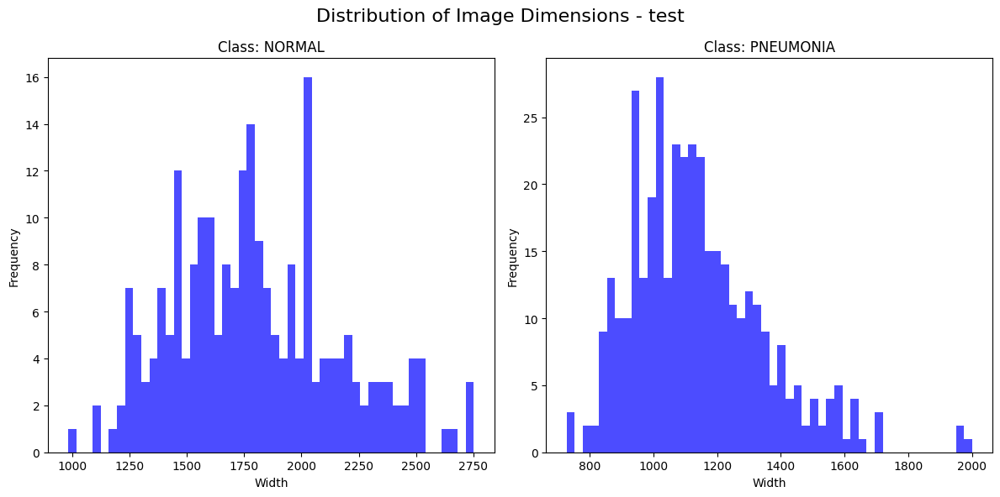

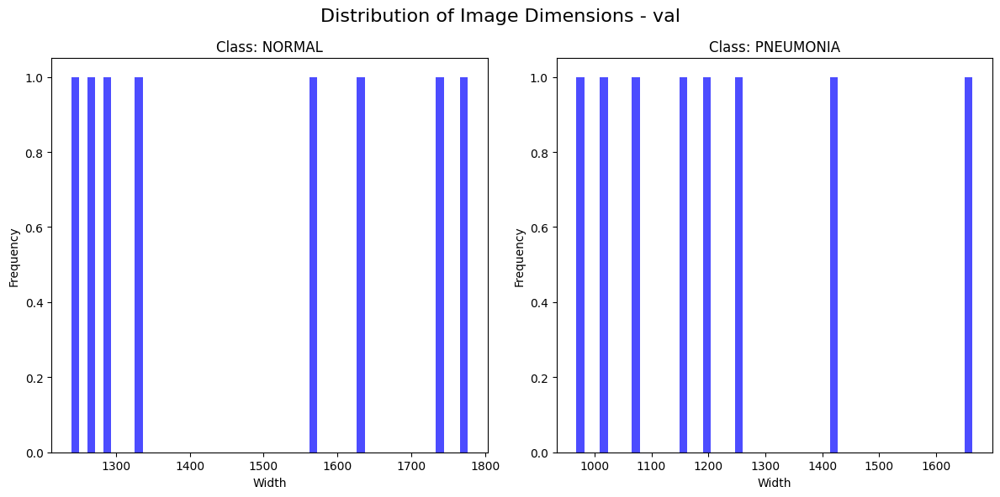

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Define the path to your dataset directory
chest_xray_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray'
# Define the subdirectories
subdirectories = ["train", "test", "val"]

# Loop through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Distribution of Image Dimensions - {subdir}", fontsize=16)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        class_widths = []
        class_heights = []

        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = img.shape[:2]
            class_widths.append(width)
            class_heights.append(height)

        plt.subplot(1, len(classes), classes.index(class_name) + 1)
        plt.hist(class_widths, bins=50, color='blue', alpha=0.7)
        plt.title(f"Class: {class_name}")
        plt.xlabel("Width")
        plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

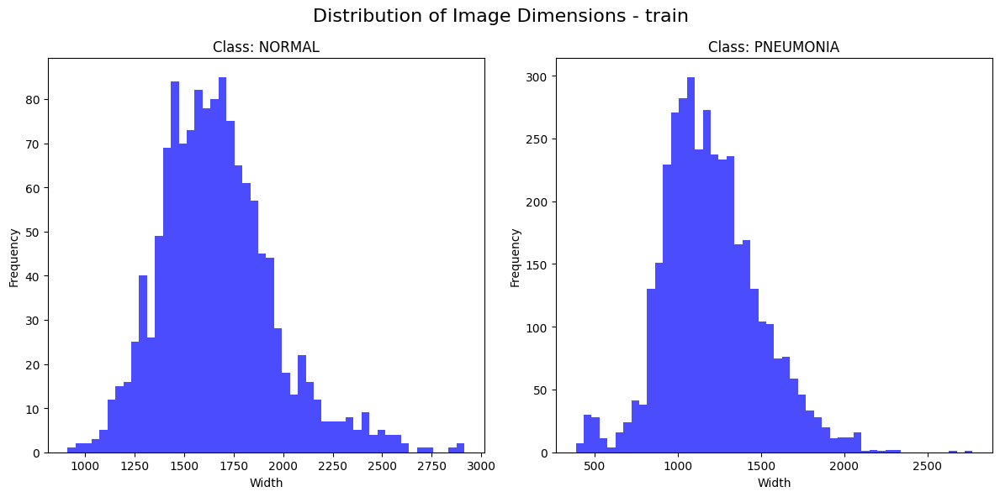

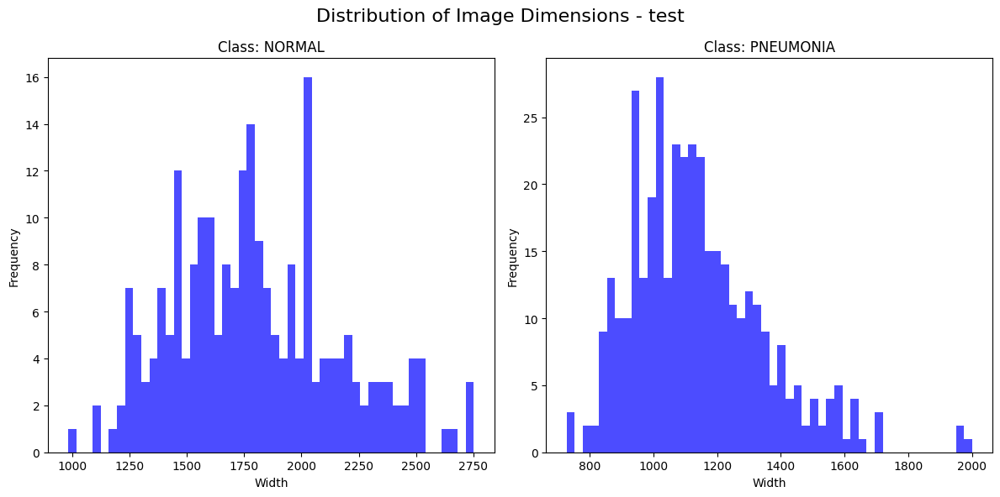

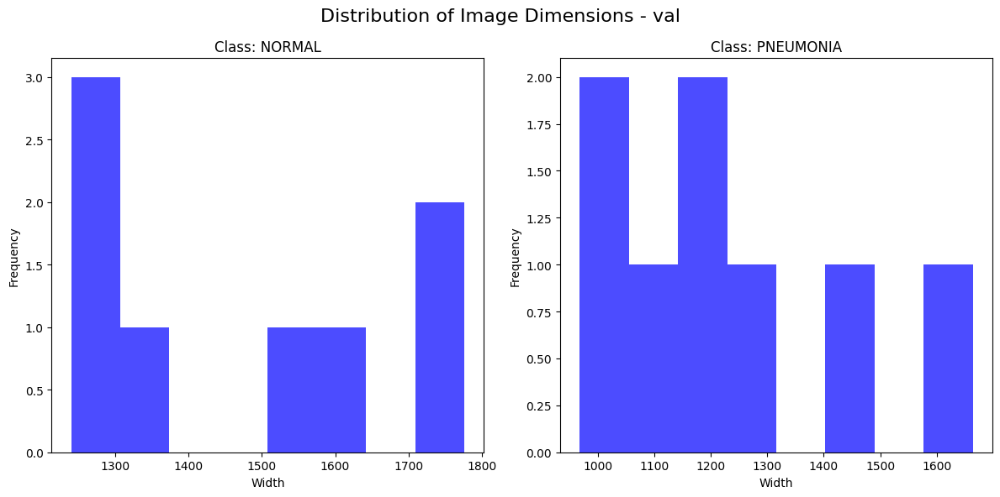

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Define the path to your dataset directory
chest_xray_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray'

# Define the subdirectories
subdirectories = ["train", "test", "val"]

# Specify the number of bins for the histograms
train_test_bins = 50
val_bins = 8  # Fewer bins for the "val" subset

# Loop through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Distribution of Image Dimensions - {subdir}", fontsize=16)

    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)

        class_widths = []
        class_heights = []

        for image_name in sample_images:
            image_path = os.path.join(class_dir, image_name)
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            height, width = img.shape[:2]
            class_widths.append(width)
            class_heights.append(height)

        plt.subplot(1, len(classes), classes.index(class_name) + 1)
        if subdir == "val":
            plt.hist(class_widths, bins=val_bins, color='blue', alpha=0.7)
        else:
            plt.hist(class_widths, bins=train_test_bins, color='blue', alpha=0.7)
        plt.title(f"Class: {class_name}")
        plt.xlabel("Width")
        plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


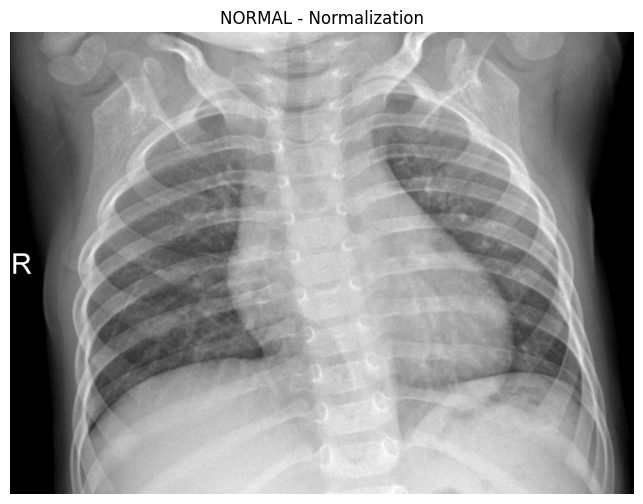

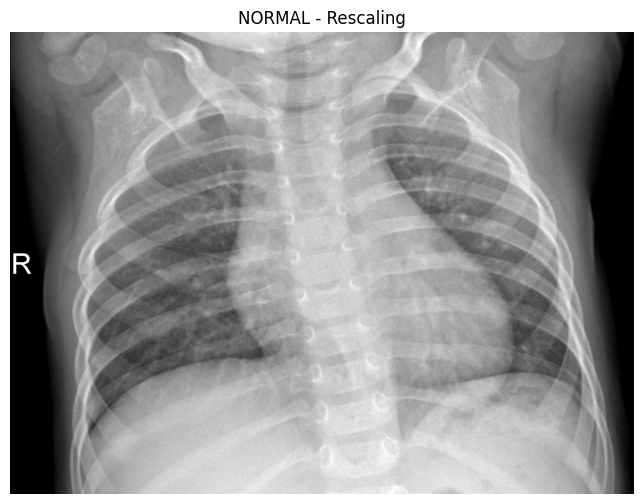

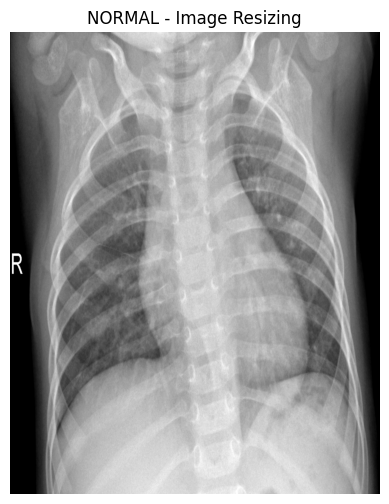

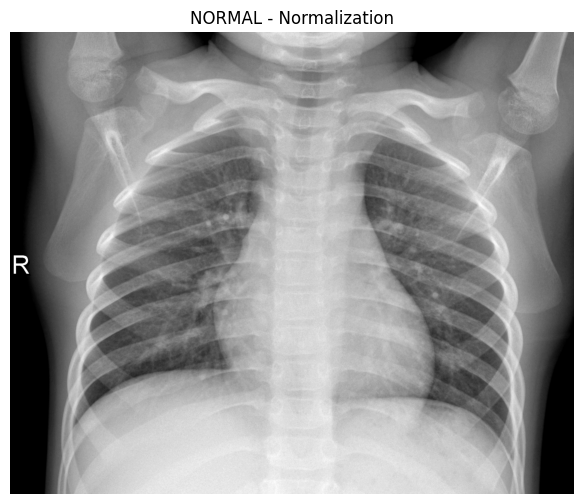

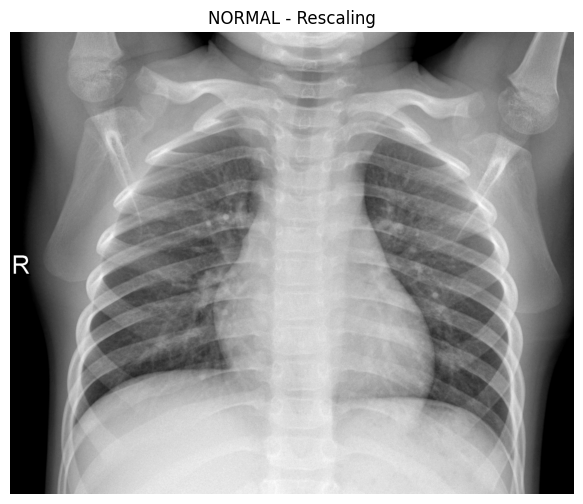

...

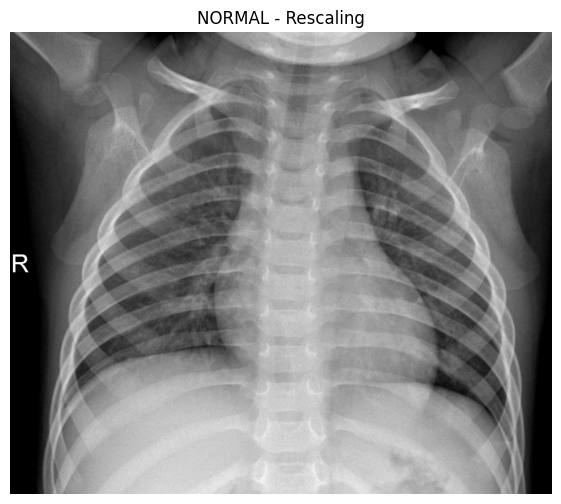

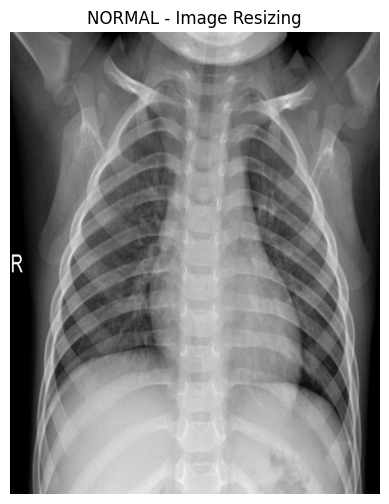

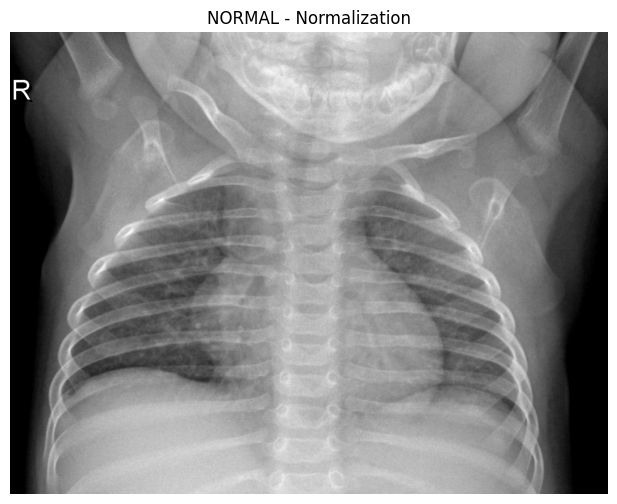

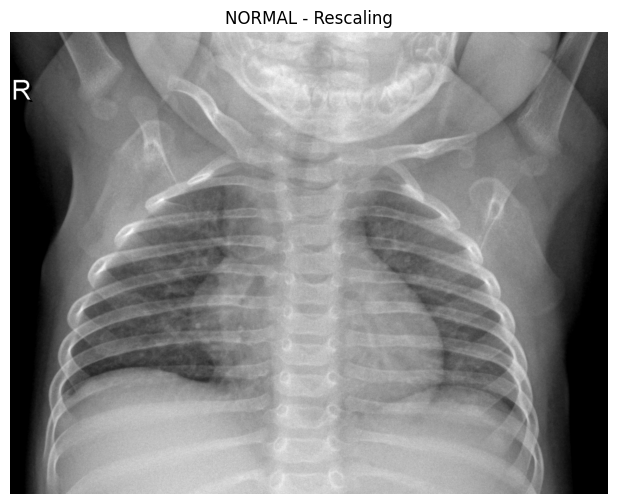

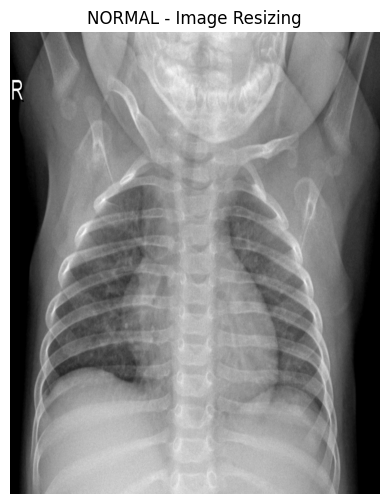

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Define the path to your dataset directory
chest_xray_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray'

# Define the subdirectories
subdirectories = ["train", "test", "val"]

# Initialize a dictionary to store image paths for each class
image_paths_by_class = defaultdict(list)

# Loop through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(chest_xray_dir, subdir)
    classes = os.listdir(subdir_path)

    # Loop through classes
    for class_name in classes:
        class_dir = os.path.join(subdir_path, class_name)
        sample_images = os.listdir(class_dir)
        image_paths_by_class[class_name].extend([os.path.join(class_dir, image_name) for image_name in sample_images])

# Data preparation techniques
techniques = {
    "Normalization": lambda img: (img - img.mean()) / img.std(),
    "Rescaling": lambda img: img / 255.0,
}

# Initialize a dictionary to store median dimensions for each subset
median_dimensions = {}

# Calculate median dimensions for each subset
for subdir, image_paths in image_paths_by_class.items():
    dimensions = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        dimensions.append(img.shape)
    median_height = np.median([height for height, _ in dimensions])
    median_width = np.median([width for _, width in dimensions])
    median_dimensions[subdir] = (int(median_height), int(median_width))

# Apply data preparation techniques and image resizing
for subdir, image_paths in image_paths_by_class.items():
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply data preparation techniques
        for technique_name, technique_function in techniques.items():
            preprocessed_img = technique_function(img)

            plt.figure(figsize=(10, 6))
            plt.title(f"{subdir} - {technique_name}")
            plt.imshow(preprocessed_img, cmap='gray')
            plt.axis('off')
            plt.show()

        # Resize images using median dimensions
        resized_img = cv2.resize(img, median_dimensions[subdir], interpolation=cv2.INTER_LINEAR)

        plt.figure(figsize=(10, 6))
        plt.title(f"{subdir} - Image Resizing")
        plt.imshow(resized_img, cmap='gray')
        plt.axis('off')
        plt.show()

print("Data preparation and visualization complete.")


In [ ]:
 # Normalization: Normalization adjusts pixel values to have a mean of zero and standard deviation of one. It standardizes data for better convergence during training.

 # Rescaling: Rescaling maps pixel values to a specific range (e.g., [0, 1]). It's a simple way to adjust image intensity and improve model convergence.

 # Resizing: Resizing changes image dimensions while preserving content. It reduces computational load and ensures uniform input size for training.

 # Fourier Transform: Fourier Transform converts images to frequency domain, revealing frequency components. Used for compression, filtering, and understanding image content in terms of frequencies.

 # Contrast & Brightness: Adjusting contrast changes the difference between light and dark areas, enhancing image details. Adjusting brightness changes overall lightness or darkness, improving image visibility

In [ ]:
train_data_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray/train'
validation_data_dir  = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray/val'
test_data_dir = '/content/drive/MyDrive/pneumonia/path_to_extracted/chest_xray/test'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation and preprocessing settings
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Normalize pixel values to [0, 1]
    rotation_range=20,  # Random rotation
    width_shift_range=0.2,  # Random horizontal shift
    height_shift_range=0.2,  # Random vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Random zoom
    horizontal_flip=True,  # Horizontal flip
    fill_mode='nearest'  # Filling mode for new pixels
)

val_datagen = ImageDataGenerator(
    rescale=1.0 / 255  # Normalize pixel values to [0, 1]
)

# Define data generators
train_generator = train_datagen.flow_from_directory(
    train_data_dir,  # Path to the training data directory
    target_size=(224, 224),  # Rescale images to this size
    batch_size=32,
    class_mode='binary'  # 'binary' for binary classification, 'categorical' for multiclass
)

validation_generator = val_datagen.flow_from_directory(
    validation_data_dir,  # Path to the validation data directory
    target_size=(224, 224),  # Rescale images to this size
    batch_size=16,
    class_mode='binary'  # 'binary' for binary classification, 'categorical' for multiclass
)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255  # Normalize pixel values to [0, 1]
)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(224, 224),  # Rescale images to this size
    batch_size=16,
    class_mode='binary'
)


Found 5190 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 618 images belonging to 2 classes.


In [ ]:
model = Sequential()
model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(2, activation='softmax'))

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

# Compile the model
model.compile(
              loss=SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Train the model
history = model.fit(train_generator,
                    epochs=5,
                    validation_data=validation_generator)


Epoch 1/5
163/163 [==============================] - 116s 696ms/step - loss: 0.2800 - accuracy: 0.8857 - val_loss: 0.5417 - val_accuracy: 0.8125
Epoch 2/5
163/163 [==============================] - 115s 706ms/step - loss: 0.2343 - accuracy: 0.9006 - val_loss: 0.4640 - val_accuracy: 0.8125
Epoch 3/5
163/163 [==============================] - 115s 706ms/step - loss: 0.2291 - accuracy: 0.9058 - val_loss: 0.4349 - val_accuracy: 0.8125
Epoch 4/5
163/163 [==============================] - 114s 695ms/step - loss: 0.2246 - accuracy: 0.9067 - val_loss: 0.6785 - val_accuracy: 0.6875
Epoch 5/5
163/163 [==============================] - 115s 707ms/step - loss: 0.2095 - accuracy: 0.9181 - val_loss: 1.6982 - val_accuracy: 0.6250


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        73792     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 64)       0

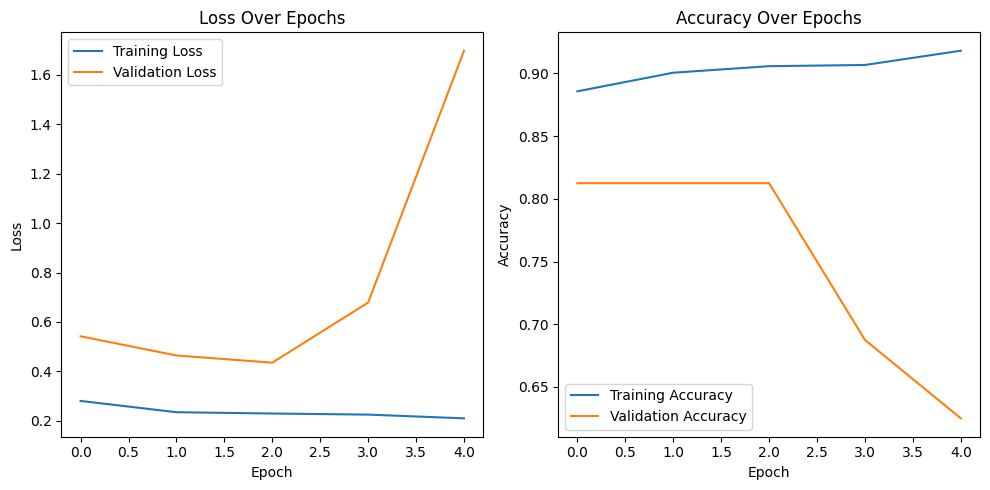

In [ ]:
import matplotlib.pyplot as plt

# Access the history object returned from model.fit()
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot loss
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator)
print("Original Model - Test Loss:", test_loss)
print("Original Model - Test Accuracy:", test_accuracy)

39/39 [==============================] - 6s 143ms/step - loss: 0.9645 - accuracy: 0.7460
Original Model - Test Loss: 0.9644762277603149
Original Model - Test Accuracy: 0.745954692363739


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model2 = Sequential()
model2.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu', input_shape=(224, 224, 3)))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))

model2.add(Flatten())

# Fully connected layers with dropout regularization
model2.add(Dense(256, activation='relu'))
model2.add(Dropout(0.5))

model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5))

model2.add(Dense(64, activation='relu'))
model2.add(Dropout(0.5))

# Output layer for binary classification
model2.add(Dense(2, activation='softmax'))

# Compile the model
model2.compile(optimizer=Adam(learning_rate=0.001),
               loss=SparseCategoricalCrossentropy(),
               metrics=['accuracy'])

# Train the model with early stopping
history2 = model2.fit(train_generator,
                      epochs=7,
                      validation_data=validation_generator,
                      callbacks=[early_stopping])


Epoch 1/7
163/163 [==============================] - 118s 708ms/step - loss: 0.5033 - accuracy: 0.7449 - val_loss: 0.5675 - val_accuracy: 0.8750
Epoch 2/7
163/163 [==============================] - 114s 701ms/step - loss: 0.3890 - accuracy: 0.8100 - val_loss: 0.7300 - val_accuracy: 0.6250
Epoch 3/7
163/163 [==============================] - 114s 699ms/step - loss: 0.3278 - accuracy: 0.8605 - val_loss: 0.6478 - val_accuracy: 0.6875
Epoch 4/7
163/163 [==============================] - 114s 699ms/step - loss: 0.2916 - accuracy: 0.8782 - val_loss: 0.4498 - val_accuracy: 0.8125
Epoch 5/7
163/163 [==============================] - 115s 706ms/step - loss: 0.2822 - accuracy: 0.8792 - val_loss: 0.9610 - val_accuracy: 0.5625
Epoch 6/7
163/163 [==============================] - 114s 699ms/step - loss: 0.2540 - accuracy: 0.8911 - val_loss: 0.7589 - val_accuracy: 0.6875
Epoch 7/7
163/163 [==============================] - 114s 697ms/step - loss: 0.2582 - accuracy: 0.8927 - val_loss: 0.4454 - val_ac

In [ ]:
model2.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 111, 111, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 109, 109, 128)     147584    
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 54, 54, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 52, 52, 64)        73792     
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 26, 26, 64)      

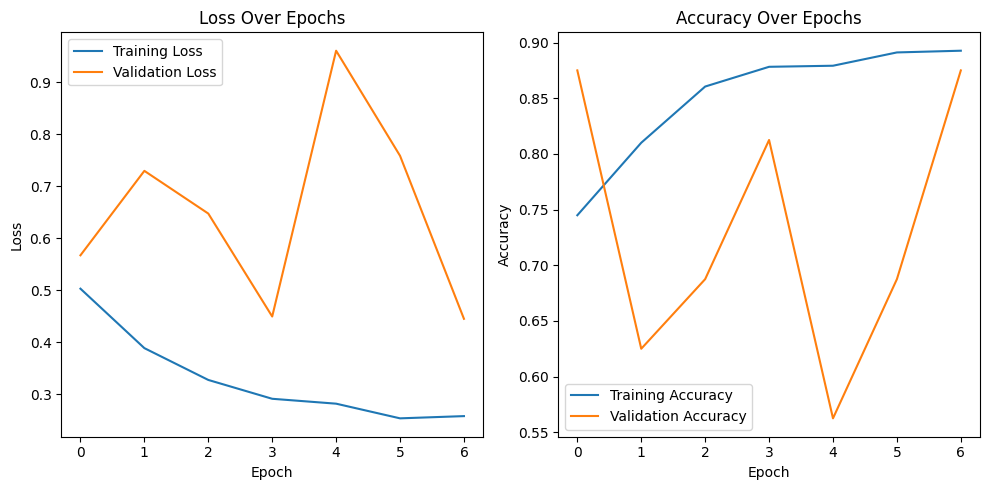

In [ ]:
# Access the history object returned from model.fit()
training_loss = history2.history['loss']
validation_loss = history2.history['val_loss']
training_accuracy = history2.history['accuracy']
validation_accuracy = history2.history['val_accuracy']

# Plot loss
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
test_loss_2, test_accuracy_2 = model2.evaluate(test_generator)
print("Model_2 - Test Loss:", test_loss)
print("Model_2 - Test Accuracy:", test_accuracy)

39/39 [==============================] - 6s 144ms/step - loss: 0.4208 - accuracy: 0.8074
Model_2 - Test Loss: 0.2814374566078186
Model_2 - Test Accuracy: 0.8851132392883301


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import GlobalAveragePooling2D

# Load the pre-trained VGG16 model with imagenet weights
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model by adding custom layers on top of the base model
model3 = Sequential()
model3.add(base_model)
model3.add(GlobalAveragePooling2D())
model3.add(Dense(256, activation='relu'))
model3.add(Dense(128, activation='relu'))
model3.add(Dense(64, activation='relu'))
model3.add(Dense(2, activation='softmax'))

# Compile the model
model3.compile(optimizer=Adam(learning_rate=0.001),
               loss=SparseCategoricalCrossentropy(),
               metrics=['accuracy'])

# Train the model
history3 = model3.fit(train_generator,
                      epochs=10,
                      validation_data=validation_generator,
                      callbacks=[early_stopping])


58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/10
163/163 [==============================] - 134s 783ms/step - loss: 0.3235 - accuracy: 0.8464 - val_loss: 0.6084 - val_accuracy: 0.7500
Epoch 2/10
163/163 [==============================] - 123s 753ms/step - loss: 0.2088 - accuracy: 0.9187 - val_loss: 0.4365 - val_accuracy: 0.6875
Epoch 3/10
163/163 [==============================] - 122s 748ms/step - loss: 0.1940 - accuracy: 0.9233 - val_loss: 0.5309 - val_accuracy: 0.7500
Epoch 4/10
163/163 [==============================] - 119s 728ms/step - loss: 0.1899 - accuracy: 0.9216 - val_loss: 0.4792 - val_accuracy: 0.7500
Epoch 5/10
163/163 [==============================] - 122s 750ms/step - loss: 0.1575 - accuracy: 0.9397 - val_loss: 0.4267 - val_accuracy: 0.7500
Epoch 6/10
163/163 [==============================] - 119s 732ms/step - loss: 0.1550 - accuracy: 0.9362 - val_loss: 0.3159 - val_accuracy: 0.8125
Epoch 7/10
163/163 [==============================] - 120s 

In [ ]:
model3.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_28 (Dense)            (None, 256)               131328    
                                                                 
 dense_29 (Dense)            (None, 128)               32896     
                                                                 
 dense_30 (Dense)            (None, 64)                8256      
                                                                 
 dense_31 (Dense)            (None, 2)                 130       
                                                      

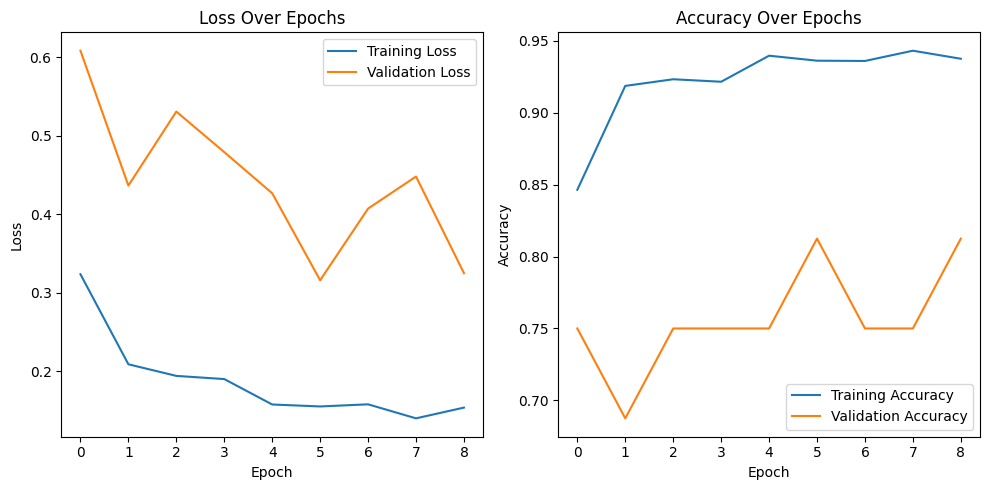

In [ ]:
# Access the history object returned from model.fit()
training_loss = history3.history['loss']
validation_loss = history3.history['val_loss']
training_accuracy = history3.history['accuracy']
validation_accuracy = history3.history['val_accuracy']

# Plot loss
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
test_loss_3, test_accuracy_3 = model3.evaluate(test_generator)
print(" Model_3 - Test Loss:", test_loss)
print(" Model_3 - Test Accuracy:", test_accuracy)

39/39 [==============================] - 7s 163ms/step - loss: 0.2814 - accuracy: 0.8851
 Model_3 - Test Loss: 0.2814374566078186
 Model_3 - Test Accuracy: 0.8851132392883301


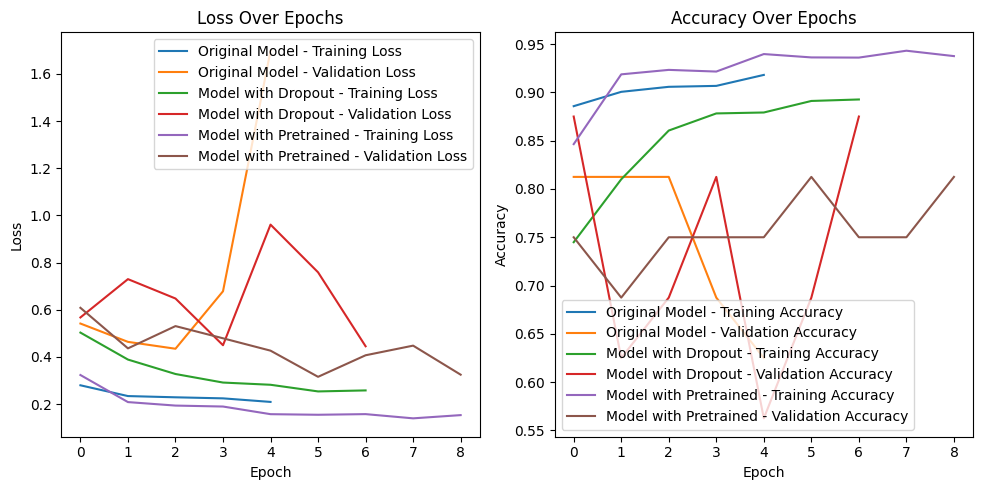

In [ ]:
import matplotlib.pyplot as plt


# Get loss and accuracy data for all three models
loss_data = [history.history['loss'], history2.history['loss'], history3.history['loss']]
val_loss_data = [history.history['val_loss'], history2.history['val_loss'], history3.history['val_loss']]
accuracy_data = [history.history['accuracy'], history2.history['accuracy'], history3.history['accuracy']]
val_accuracy_data = [history.history['val_accuracy'], history2.history['val_accuracy'], history3.history['val_accuracy']]

# Plot loss for all models
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_data[0], label='Original Model - Training Loss')
plt.plot(val_loss_data[0], label='Original Model - Validation Loss')
plt.plot(loss_data[1], label='Model with Dropout - Training Loss')
plt.plot(val_loss_data[1], label='Model with Dropout - Validation Loss')
plt.plot(loss_data[2], label='Model with Pretrained - Training Loss')
plt.plot(val_loss_data[2], label='Model with Pretrained - Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot accuracy for all models
plt.subplot(1, 2, 2)
plt.plot(accuracy_data[0], label='Original Model - Training Accuracy')
plt.plot(val_accuracy_data[0], label='Original Model - Validation Accuracy')
plt.plot(accuracy_data[1], label='Model with Dropout - Training Accuracy')
plt.plot(val_accuracy_data[1], label='Model with Dropout - Validation Accuracy')
plt.plot(accuracy_data[2], label='Model with Pretrained - Training Accuracy')
plt.plot(val_accuracy_data[2], label='Model with Pretrained - Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:

#visualising test loss and accuracy across all 3 models
# Store the test loss and accuracy in separate variables
test_loss_original_model = test_loss
test_accuracy_original_model = test_accuracy

test_loss_model_with_dropout = test_loss_2
test_accuracy_model_with_dropout = test_accuracy_2

test_loss_model_with_pretrained = test_loss_3
test_accuracy_model_with_pretrained = test_accuracy_3

# Alternatively, you can store the values in dictionaries
test_results = {
    "Original Model": {"loss": test_loss, "accuracy": test_accuracy},
    "Model with Dropout": {"loss": test_loss_2, "accuracy": test_accuracy_2},
    "Model with Pretrained": {"loss": test_loss_3, "accuracy": test_accuracy_3}
}

# Accessing test results using dictionaries
print("Test Loss for Original Model:", test_results["Original Model"]["loss"])
print("Test Accuracy for Model with Dropout:", test_results["Model with Dropout"]["accuracy"])
print("Test Loss for Model with Pretrained:", test_results["Model with Pretrained"]["loss"])


Test Loss for Original Model: 0.9644762277603149
Test Accuracy for Model with Dropout: 0.807443380355835
Test Loss for Model with Pretrained: 0.2814374566078186


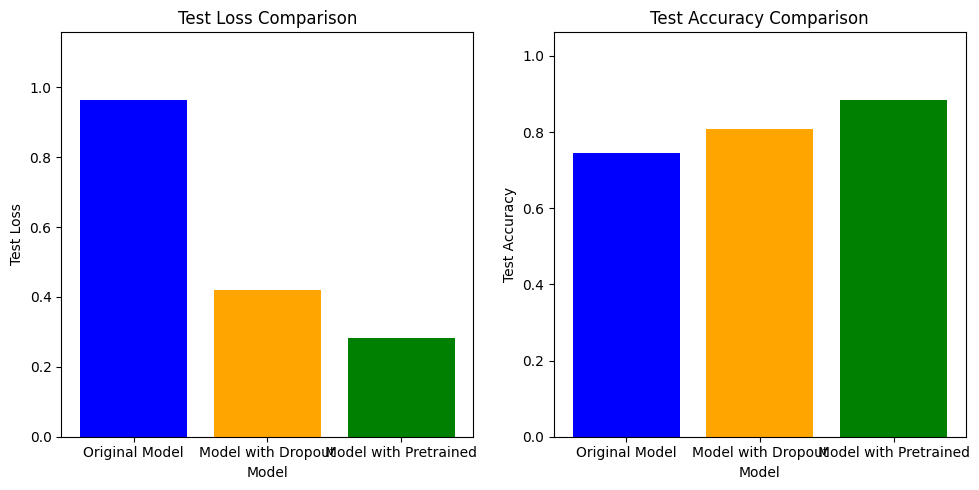

In [ ]:
import matplotlib.pyplot as plt

# Test loss and accuracy values for all three models
test_loss_values = [test_loss, test_loss_2, test_loss_3]
test_accuracy_values = [test_accuracy, test_accuracy_2, test_accuracy_3]

# Model names for labeling
model_names = ['Original Model', 'Model with Dropout', 'Model with Pretrained']

# Plot test loss
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(model_names, test_loss_values, color=['blue', 'orange', 'green'])
plt.xlabel('Model')
plt.ylabel('Test Loss')
plt.title('Test Loss Comparison')
plt.ylim(0, max(test_loss_values) * 1.2)

# Plot test accuracy
plt.subplot(1, 2, 2)
plt.bar(model_names, test_accuracy_values, color=['blue', 'orange', 'green'])
plt.xlabel('Model')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy Comparison')
plt.ylim(0, max(test_accuracy_values) * 1.2)

plt.tight_layout()
plt.show()
